In [1]:
import plotly
import os

# for data aggregation.
import numpy as np
import pandas as pd
import geopandas as gpd
from geopy.distance import distance, lonlat

# for data visualisation.
#import plotly_express as px
import plotly.plotly as py
import cufflinks as cf 
cf.go_offline(connected=True)
cf.set_config_file(theme='polar')
import deckgljupyter.Layer as deckgl

import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from tqdm import tqdm_notebook
plotly.__version__

import deckgljupyter.Layer as deckgl
#from geoband.API import *

#GetCompasData('../data/PJT001_h_100m_cell_flow.geojson')
from shapely.geometry import Polygon, LineString, Point
from shapely.ops import nearest_points
import pyproj
from pyproj import Transformer

import matplotlib as mpl
import matplotlib.pylab as plt
import datetime

import pycrs 
import geoplot as gplt
import geoplot.crs as gcrs

from tqdm import tqdm, trange
from time import sleep

In [145]:
#ID-WGS set 

#filepath = './data/ULSAN_NG_2018.csv'
#df_=pd.read_csv(filepath,index_col=0)
filepath = './data/ULSAN_NG_2018_raw.csv'
df_=pd.read_csv(filepath,index_col=0)

id_wgs=pd.merge(id_set,df[['id','x','y']],how='left',on='id').drop_duplicates().reset_index().drop(['index'],axis=1)
transproj_eq = Transformer.from_proj(
    '+proj=tmerc     +lat_0=38     +lon_0=128     +k=0.9999     +x_0=400000     +y_0=600000     +ellps=bessel     +towgs84=-115.8,474.99,674.11,1.16,-2.31,-1.63,6.43 +units=m +no_defs',
    'EPSG:4326',
    always_xy=True,
    skip_equivalent=True)
df_pop=id_wgs
coor_array=np.array(df_pop[['x','y']])
coor=[]
for i in tqdm(range(len(df_pop))):
    coor.append((coor_array[i][0],coor_array[i][1]))
WGS_list=[]
for pt in tqdm(transproj_eq.itransform(coor)):
    WGS=('{:.20f} {:.20f}'.format(*pt).split(' '))
    WGS_list.append((float(WGS[0]),float(WGS[1])))

WGS_lat=[]
WGS_lon=[]

for i in WGS_list: 
    WGS_lon.append(i[0])
    WGS_lat.append(i[1])
# Data frame에 한번에 연결시켜주기
df_pop['WGS_lat']=np.nan
df_pop['WGS_lon']=np.nan

for i in range(len(df_pop)):
    df_pop['WGS_lon'][i]=WGS_lon[i]
    df_pop['WGS_lat'][i]=WGS_lat[i]

#df_pop.to_csv('data/id_wgs_set.csv')  


100%|██████████| 25983/25983 [00:00<00:00, 598926.14it/s]

0it [00:00, ?it/s]
25983it [00:00, 214669.04it/s]

100%|██████████| 25983/25983 [00:00<00:00, 880181.89it/s]

100%|██████████| 25983/25983 [00:02<00:00, 9375.45it/s]


In [152]:
## Street information

#Coordinate information
crs=pycrs.load.from_file("GRS80_UTMK.prj").to_proj4()
crs='+proj=tmerc +lat_0=38 +lon_0=127.5 +k=0.9996 +x_0=1000000 +y_0=2000000 +ellps=GRS80 +units=m +no_defs'
transproj_eq = Transformer.from_proj(
    crs,
    'EPSG:4326',
    always_xy=True,
    skip_equivalent=True)

transproj_eq

street_file = "./data/street/TL_SPRD_MANAGE.shp"
street = gpd.read_file(street_file, encoding='euckr')
#street[['RN','RN_CD','geometry']]    

x=street['geometry'][0]
def line_to_coordinates(x):
    L=x.coords[:]
    lat=[]
    lon=[]
    for i in range(len(L)):
        lat.append(L[i][1])
        lon.append(L[i][0])
    return [(x,y) for x,y in zip(lon,lat)]

street['coordinates'] = np.nan
street['coordinates'] = street['geometry'].apply(line_to_coordinates) 
street_0= gpd.GeoDataFrame(street[['RN','RN_CD','coordinates']] )

WGS_street_list=[]

for i in range(len(street_0)):
    WGS_list=[]
    for pt in transproj_eq.itransform(street_0['coordinates'][i]):
        WGS=('{:.20f} {:.20f}'.format(*pt).split(' '))
        WGS_list.append((float(WGS[0]),float(WGS[1])))
    WGS_street_list.append(WGS_list)

geo_total=[]
for i in range(len(WGS_street_list)):
    geo=gpd.GeoDataFrame(index=[0], crs={'init': 'epsg:4326'}, geometry=[LineString(WGS_street_list[i])])
    geo_total.append([street_0['RN'][i],street_0['RN_CD'][i],geo['geometry']])

RN_geo=gpd.GeoDataFrame(geo_total)
RN_geo.columns=['RN','RN_CD','geometry']
RN_geo


<Concatenated Operation Transformer: pipeline>
Description: Inverse of unknown + Ballpark geographic offset from unknown to WGS 84 + axis order change (2D)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)

,RN,RN_CD,geometry
0,울산고속도로,1000008,0 LINESTRING (129.2605590986902 35.55217834...
1,동해고속도로,1000026,0 LINESTRING (129.2436992008299 35.53549697...
2,산업로,3000104,0 LINESTRING (129.3226169976822 35.50807201...
3,산업로,3000104,0 LINESTRING (129.3088430109262 35.50324029...
4,화합로,3011003,0 LINESTRING (129.3423929283966 35.52891716...
...,...,...,...
1565,테크노산업로81번길,4854920,0 LINESTRING (129.2956160192631 35.51253632...
1566,테크노산업로82번길,4854921,0 LINESTRING (129.2954618746483 35.51279744...
1567,신항로716번길,4854922,0 LINESTRING (129.3648213847221 35.45950825...
1568,신항로742번길,4854923,0 LINESTRING (129.365002286111 35.461826610...


In [ ]:
# too long #
id_wgs_set = pd.read_csv('data/id_wgs_set.csv',index_col)
id_info=id_wgs_set
RN_CD_list=[]
id_list =[]
for j in tqdm(range(len(id_info))):
    p = id_info.geometry[j]
    id_list.append(int(id_info.id[j]))
    p_dist=[]
    for i in range(len(street_line)):
        line = street_line.geometry[i][0]
        p_dist.append([street_line.RN_CD[i],p.distance(line)])    
    a=pd.DataFrame(p_dist)
    a.columns=['RN_CD','dist']
    RNs=str(a[a.dist.isin([min(a['dist'])])]['RN_CD'].to_list()[0])
    RN_CD_list.append(RNs)
    
dict_id_street=dict(zip(id_list,RN_CD_list))
import json
#json 파일로 저장
with open('dict/dict_id_street.json', 'w', encoding='utf-8') as make_file:
    json.dump(dict_id_street, make_file, indent="\t")


In [153]:
# id_wgs_rn
id_wgs_set=pd.read_csv('data/id_wgs_set.csv',index_col=0)

import json
with open('dict/dict_id_street.json', 'r') as f:
    dict_id_street = json.load(f)
id_wgs_rn=id_wgs_set[['id','WGS_lat','WGS_lon']]
id_wgs_rn['RN_CD']=np.nan

for i in tqdm(range(len(id_wgs_rn))):
    id_wgs_rn['RN_CD'][i]=dict_id_street[str(id_wgs_rn.id[i])] 
#id_wgs_rn.to_csv('data/id_wgs_rn.csv')

id_rn=pd.DataFrame.from_dict(dict_id_street,orient='index',columns=['RN_CD'])
id_rn.index.name='id'
id_rn.reset_index(inplace=True)




  0%|          | 0/25983 [00:00<?, ?it/s]

  5%|▍         | 1266/25983 [00:00<00:01, 12652.23it/s]

 10%|█         | 2610/25983 [00:00<00:01, 12878.28it/s]

 15%|█▌        | 3972/25983 [00:00<00:01, 13091.41it/s]

 21%|██        | 5336/25983 [00:00<00:01, 13248.90it/s]

 26%|██▌       | 6720/25983 [00:00<00:01, 13420.42it/s]

 31%|███       | 7995/25983 [00:00<00:01, 13209.38it/s]

 36%|███▌      | 9323/25983 [00:00<00:01, 13229.37it/s]

 41%|████      | 10688/25983 [00:00<00:01, 13350.44it/s]

 46%|████▋     | 12081/25983 [00:00<00:01, 13516.59it/s]

 52%|█████▏    | 13469/25983 [00:01<00:00, 13622.82it/s]

 57%|█████▋    | 14861/25983 [00:01<00:00, 13709.20it/s]

 63%|██████▎   | 16263/25983 [00:01<00:00, 13799.03it/s]

 68%|██████▊   | 17627/25983 [00:01<00:00, 13722.64it/s]

 73%|███████▎  | 19008/25983 [00:01<00:00, 13747.44it/s]

 79%|███████▊  | 20399/25983 [00:01<00:00, 13794.69it/s]

 84%|████████▍ | 21802/25983 [00:01<00:00, 13864.02it/s]

 89%|████████▉ | 23209/25983 [00:0

,id,RN_CD
0,102892556,3351512
1,102892557,3351512
2,102892558,3351512
3,102892560,3351512
4,102892562,3351512
...,...,...
25978,100662166,3011006
25979,100662167,3011006
25980,100662168,3011006
25981,100662169,3011006


In [ ]:
id_rn
id_wgs_rn

In [49]:
ZIP=gpd.read_file('data/HangJeongDong_ver20190908.geojson')
zip_pop=pd.read_csv('data/ULSAN_NG_Residence_201911_utf.csv')
#ZIP[ZIP['adm_nm'].str.contains('울산')].head()
ZIP['admi_cd']=np.nan
for i in range(len(ZIP)):
    ZIP['admi_cd'][i]=ZIP['adm_cd2'][i][0:-2]
zip_pop['admi_cd']=np.nan
ulsan_zip=ZIP[ZIP['adm_nm'].str.contains('울산')]
for i in range(len(zip_pop)):        
    target_zip=str(zip_pop['행정동'][i]).strip()
    zip_pop['admi_cd'][i]=ulsan_zip[ulsan_zip['adm_nm'].str.contains(target_zip)]['admi_cd']

zip_pop=pd.merge(ZIP,zip_pop,on='admi_cd').drop(['행정동','위도','경도','구전체 인구에 대한 구성비(%)','adm_cd2','adm_cd','OBJECTID'],axis=1)
zip_pop=zip_pop.rename(columns={'세대수(세대)': 'households', '인구수(명)': 'pop','남자인구수(명)':'m_pop','여자인구수(명)':'f_pop'})
max_value = sum(zip_pop['pop'])
zip_pop['pop_ratio'] =np.nan
for i in range(len(zip_pop['pop'])):
    zip_pop['pop_ratio'][i]=zip_pop['pop'][i]/max_value
zip_pop=gpd.GeoDataFrame(zip_pop)

In [226]:
zip_pop

,adm_nm,geometry,admi_cd,households,pop,m_pop,f_pop,pop_ratio
0,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,31140510.0,9547,19144,9720,9424,0.059076
1,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...",31140520.0,9749,25513,13102,12411,0.078730
2,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,31140530.0,7266,16410,8362,8048,0.050639
3,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,31140540.0,9215,23570,11891,11679,0.072734
4,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,31140550.0,4534,8867,4718,4149,0.027363
5,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,31140560.0,13130,27910,14056,13854,0.086127
6,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,31140570.0,22085,49346,25452,23894,0.152276
7,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,31140585.0,9518,22178,11291,10887,0.068439
8,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,31140595.0,12958,33402,17062,16340,0.103075
9,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,31140600.0,8626,24441,12234,12207,0.075422


In [228]:
zip_pop[['adm_nm','pop','pop_ratio']].sort_values(by='pop',ascending=False).to_csv('data/zip_pop.csv',encoding='euc-kr')

In [21]:

def read(filename):
    df_=pd.read_csv(filename,index_col=0 )
    #if df_['WGS_lon'][0] < 100:
    #    df_ = df_.rename(columns={'WGS_lat': 'WGS_lon', 'WGS_lon': 'WGS_lat'})
    if sum(df_.columns.isin(['Unnamed: 0.1']))==1:
        df_=df_.drop(['Unnamed: 0.1'],axis=1)
    return (df_)

def multipolygon_to_coordinates(x): 
        lon, lat = x[0].exterior.xy
        return [[x, y] for x, y in zip(lon, lat)]

In [160]:
#id-grid mapping
id_wgs_set=pd.read_csv('data/id_wgs_set.csv',index_col=0)
id_geo=gpd.GeoDataFrame(id_wgs_set, geometry=gpd.points_from_xy(id_wgs_set.WGS_lon, id_wgs_set.WGS_lat))

#polygon
m_lon=id_wgs_rn.WGS_lon
m_lat = id_wgs_rn.WGS_lat
numcols, numrows = 50, 50
xi = np.linspace(m_lon.min(), m_lon.max(), numcols)
yi = np.linspace(m_lat.min(), m_lat.max(), numrows)
xi, yi = np.meshgrid(xi, yi)

grid_geo=[]
for j in range(len(xi)-1):    
    for i in range(len(xi)-1):
        grid_geo.append([str(j).zfill(2)+str(i).zfill(2),Polygon([(xi[j][i],yi[j][i]),(xi[j+1][i],yi[j+1][i]),(xi[j+1][i+1],yi[j+1][i+1]),(xi[j][i+1],yi[j][i+1])])])
grid_geo=pd.DataFrame(grid_geo)
grid_geo.columns=['grid_id','geometry']
grid_geo=gpd.GeoDataFrame(grid_geo, geometry = 'geometry')
grid_geo.to_file("data/grid_geo.shp")
grid_geo = gpd.read_file("data/grid_geo.shp")

from geopandas.tools import sjoin
id_grid=sjoin(id_geo, grid_geo, how='left')[['id','grid_id']]

dict_id_grid=dict(zip(id_grid['id'],id_grid['grid_id']))
dict_grid_geo=dict(zip(grid_geo['grid_id'],grid_geo['geometry'])) #polygon
dict_id_geo = dict(zip(id_geo['id'],id_geo['geometry'])) #point

In [236]:
time_zip

,admi_cd,total,adm_nm,geometry,coordinates,total_norm,pop_ratio,ratio
0,31140510,1664323,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,"[[129.3087427761205, 35.55228424713286], [129....",0.032554,0.059076,0.551047
1,31140520,3394710,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...","[[129.3128727965418, 35.5380952826717], [129.3...",0.066400,0.078730,0.843383
2,31140530,2077216,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,"[[129.31615368450642, 35.55056444157702], [129...",0.040630,0.050639,0.802337
3,31140540,2913754,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,"[[129.32381724413133, 35.53123106975014], [129...",0.056992,0.072734,0.783569
4,31140550,1065166,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,"[[129.32619918927585, 35.541602263426576], [12...",0.020834,0.027363,0.761420
5,31140560,6454655,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,"[[129.33044641265232, 35.53169708650976], [129...",0.126252,0.086127,1.465875
6,31140570,16548433,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,"[[129.3309862897484, 35.549962291519066], [129...",0.323684,0.152276,2.125635
7,31140585,2943106,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,"[[129.28952303078972, 35.548602665200626], [12...",0.057566,0.068439,0.841138
8,31140595,5672501,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,"[[129.26055288229233, 35.55210671634574], [129...",0.110953,0.103075,1.076430
9,31140600,2654621,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,"[[129.29467017131714, 35.542754823806455], [12...",0.051924,0.075422,0.688442


In [238]:
if weekday==True:
    week = 365-(54*2)
else: week = 54*2
time_zip['mean_total']=np.nan
for i in range(len(time_zip['mean_total'])):
    time_zip['mean_total'][i]=(round(time_zip['total'][i]/week))
time_zip

,admi_cd,total,adm_nm,geometry,coordinates,total_norm,pop_ratio,ratio,mean_total
0,31140510,1664323,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,"[[129.3087427761205, 35.55228424713286], [129....",0.032554,0.059076,0.551047,15410.0
1,31140520,3394710,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...","[[129.3128727965418, 35.5380952826717], [129.3...",0.066400,0.078730,0.843383,31432.0
2,31140530,2077216,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,"[[129.31615368450642, 35.55056444157702], [129...",0.040630,0.050639,0.802337,19233.0
3,31140540,2913754,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,"[[129.32381724413133, 35.53123106975014], [129...",0.056992,0.072734,0.783569,26979.0
4,31140550,1065166,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,"[[129.32619918927585, 35.541602263426576], [12...",0.020834,0.027363,0.761420,9863.0
5,31140560,6454655,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,"[[129.33044641265232, 35.53169708650976], [129...",0.126252,0.086127,1.465875,59765.0
6,31140570,16548433,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,"[[129.3309862897484, 35.549962291519066], [129...",0.323684,0.152276,2.125635,153226.0
7,31140585,2943106,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,"[[129.28952303078972, 35.548602665200626], [12...",0.057566,0.068439,0.841138,27251.0
8,31140595,5672501,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,"[[129.26055288229233, 35.55210671634574], [129...",0.110953,0.103075,1.076430,52523.0
9,31140600,2654621,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,"[[129.29467017131714, 35.542754823806455], [12...",0.051924,0.075422,0.688442,24580.0


In [239]:

def cell_flow_df (df_,weekday,timezn):
    if weekday==True:
        weekday = [0,1,2,3,4,5]
    else:
        weekday = [5,6]
    gdf_time_0=df_[df_.timezn_cd.isin(timezn)&df_.weekday.isin(weekday)]
    gdf_time_g=gdf_time_0[['id','total']].groupby('id').sum(axis=1)#시간 다소 소요
    gdf_time_1=pd.merge(gdf_time_g,gdf_time_0[['id','admi_cd']],on='id' )
    gdf_time_1=gdf_time_1.drop_duplicates().reset_index().drop(['index'],axis=1)
    gdf=pd.merge(gdf_time_1,id_point[['id','WGS_lat','WGS_lon','geometry']])

    # 행정동별 
    gdf_time_zip=gdf.groupby('admi_cd').total.sum()
    gdf_time_zip = pd.DataFrame(gdf_time_zip)
    gdf_time_zip=pd.merge(gdf_time_zip,ZIP[['admi_cd','adm_nm','geometry']],on='admi_cd')
    gdf_time_zip['coordinates'] = gdf_time_zip['geometry'].apply(multipolygon_to_coordinates)

    #Normalization
    max_value = sum(gdf_time_zip['total'])
    gdf_time_zip['total_norm'] =np.nan
    for i in range(len(gdf_time_zip['total'])):
        gdf_time_zip['total_norm'][i]=gdf_time_zip['total'][i]/max_value

    gdf_time_zip=pd.merge(gdf_time_zip, zip_pop[['admi_cd','pop_ratio']], on ='admi_cd')
    gdf_time_zip['ratio'] =np.nan
    for i in range(len(gdf_time_zip['ratio'])):
        gdf_time_zip['ratio'][i]=gdf_time_zip['total_norm'][i]/gdf_time_zip['pop_ratio'][i]

    gdf_time_0=gpd.GeoDataFrame(gdf[['id','geometry','total']])
    gdf_time_zip_0=gpd.GeoDataFrame(gdf_time_zip)
    return(gdf_time_0,gdf_time_zip_0)

def zip_plot(df_zip,timezn,weekday):    
    if weekday ==True:
        w='weekday'
    else: w='weekend'

    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.axis('off')
    title=str('At the ' + str(timezn[0]).zfill(2)) +' to ' + str(timezn[3]).zfill(2)
    ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
    date_info=w+str(2018)
    ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
    df_zip.plot(column='ratio',legend=True,cmap='OrRd',ax=ax,linewidth=0.8,edgecolor='0')
    fig.savefig('./fig/0210/zip_'+w+str(timezn[0]).zfill(2)+'.png', dpi=300)
    
def result_street(time_T,weekday,timezn): 
    if weekday ==True:
        w='weekday'
    else: w='weekend'
    id_rn_T_0=pd.merge(time_T[['id','total']],id_wgs_rn[['id','RN_CD']],on='id',how='left')
    id_rn_T=id_rn_T_0.groupby('RN_CD').sum(axis=1)#시간 다소 소요
    id_rn_T.index.name = 'RN_CD'
    id_rn_T.reset_index(inplace=True)
    id_rn_T=pd.merge(id_rn_T,RN_geo[['RN_CD','RN']],on='RN_CD',how='left').drop_duplicates().reset_index().drop(['index'],axis=1)
    if weekday==True:
        week = 365-(54*2)
    else: week = 54*2
    id_rn_T['mean_total']=np.nan    
    for i in range(len(id_rn_T['mean_total'])):
        id_rn_T['mean_total'][i]=(round(id_rn_T['total'][i]/week))

    filename=w+str(timezn[0]).zfill(2)
    id_rn_T.sort_values(by='total',ascending=False).to_csv('fig/0210/'+filename+'.csv',encoding='euc-kr')
    
def result_zip(time_zip,weekday,timezn): 
    if weekday ==True:
        w='weekday'
    else: w='weekend'
    if weekday==True:
        week = 365-(54*2)
    else: week = 54*2
    time_zip['mean_total']=np.nan
    for i in range(len(time_zip['mean_total'])):
        time_zip['mean_total'][i]=(round(time_zip['total'][i]/week))
    filename='zip'+w+str(timezn[0]).zfill(2)
    time_zip[['admi_cd','adm_nm','mean_total','pop_ratio','total','ratio','total_norm']].sort_values(by='ratio',ascending=False).to_csv('fig/0210/'+filename+'.csv',encoding='euc-kr')
    
def KDE_plot(df_point,df_zip,timezn,weekday):
    if weekday ==True:
        w='weekday'
    else: w='weekend'

    ax = gplt.kdeplot(df_point,cbar=True,clip=df_zip.geometry,
    shade=True, cmap='Reds',
    projection=gplt.crs.AlbersEqualArea(), figsize=(10,6))
    title=str('The cell flow at the ' + str(timezn[0]).zfill(2))
    ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
    date_info=w+'2018'
    ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
    a=gplt.polyplot(df_zip, ax=ax, zorder=1)
    a.figure.savefig('./fig/0210/'+w+str(timezn[0]).zfill(2)+'.png', dpi=300)


In [218]:
zip_pop

,adm_nm,geometry,admi_cd,households,pop,m_pop,f_pop,pop_ratio
0,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,31140510.0,9547,19144,9720,9424,0.059076
1,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...",31140520.0,9749,25513,13102,12411,0.078730
2,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,31140530.0,7266,16410,8362,8048,0.050639
3,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,31140540.0,9215,23570,11891,11679,0.072734
4,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,31140550.0,4534,8867,4718,4149,0.027363
5,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,31140560.0,13130,27910,14056,13854,0.086127
6,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,31140570.0,22085,49346,25452,23894,0.152276
7,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,31140585.0,9518,22178,11291,10887,0.068439
8,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,31140595.0,12958,33402,17062,16340,0.103075
9,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,31140600.0,8626,24441,12234,12207,0.075422


(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'The popolation map')

Text(0.1, 0.1, 'Source: KT, 2018')

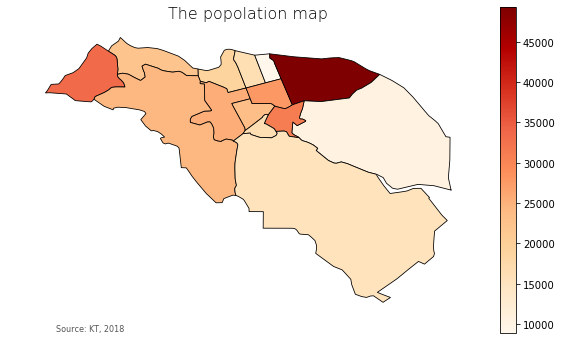

In [223]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
title=str('The popolation map')
ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
date_info=str(2018)
ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
zip_pop.plot(column='pop',legend=True,cmap='OrRd',ax=ax,linewidth=0.8,edgecolor='0')
fig.savefig('./fig/0210/zip_pop.png', dpi=300)

In [240]:
T1=[6,7,8,9]
T2=[10,11,12,13]
T3=[14,15,16,17]
T4=[18,19,20,21]
T5=[22,23,0,1]
T6=[2,3,4,5]



weekday=True
for i in [T1,T2,T3,T4,T5,T6]:
    timezn=i    
    time_T,time_zip=cell_flow_df(df_,weekday,timezn)
    #zip_plot(time_zip_w,timezn,weekday)
    #KDE_plot(time_T,time_zip_w,timezn,weekday)
    result_street(time_T,weekday,timezn)
    result_zip(time_zip,weekday,timezn)
    
weekday=False
for i in [T1,T2,T3,T4,T5,T6]:
    timezn=i    
    time_T,time_zip=cell_flow_df(df_,weekday,timezn)
    #zip_plot(time_zip_w,timezn,weekday)
    #KDE_plot(time_T,time_zip_w,timezn,weekday)
    result_street(time_T,weekday,timezn)
    result_zip(time_zip,weekday,timezn)

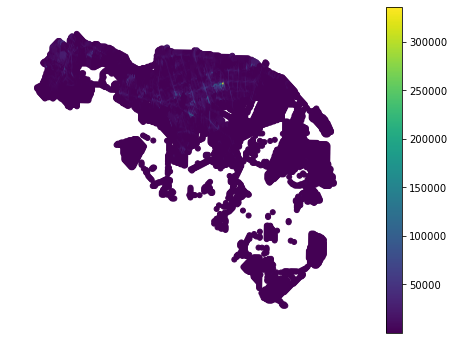

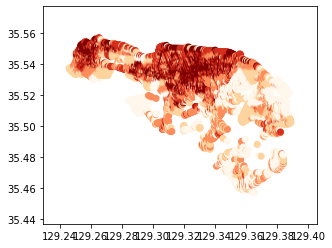

In [243]:

gplt.pointplot(time_T, projection=gcrs.AlbersEqualArea(), hue='total', legend=True)
time_T.plot(column='total', cmap='OrRd', scheme='quantiles')

In [216]:
weekday=False
for i in [T1,T2,T3,T4,T5,T6]:
    timezn=i    
    time_T,time_zip=cell_flow_df(df_,weekday,timezn)
    #zip_plot(time_zip_w,timezn,weekday)
    #KDE_plot(time_T,time_zip_w,timezn,weekday)
    #result_street(time_T,weekday,timezn)
    result_zip(time_zip,weekday,timezn)

In [212]:
time_zip_w

,admi_cd,total,adm_nm,geometry,coordinates,total_norm,pop_ratio,ratio
0,31140510,1664323,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,"[[129.3087427761205, 35.55228424713286], [129....",0.032554,0.059076,0.551047
1,31140520,3394710,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...","[[129.3128727965418, 35.5380952826717], [129.3...",0.066400,0.078730,0.843383
2,31140530,2077216,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,"[[129.31615368450642, 35.55056444157702], [129...",0.040630,0.050639,0.802337
3,31140540,2913754,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,"[[129.32381724413133, 35.53123106975014], [129...",0.056992,0.072734,0.783569
4,31140550,1065166,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,"[[129.32619918927585, 35.541602263426576], [12...",0.020834,0.027363,0.761420
5,31140560,6454655,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,"[[129.33044641265232, 35.53169708650976], [129...",0.126252,0.086127,1.465875
6,31140570,16548433,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,"[[129.3309862897484, 35.549962291519066], [129...",0.323684,0.152276,2.125635
7,31140585,2943106,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,"[[129.28952303078972, 35.548602665200626], [12...",0.057566,0.068439,0.841138
8,31140595,5672501,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,"[[129.26055288229233, 35.55210671634574], [129...",0.110953,0.103075,1.076430
9,31140600,2654621,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,"[[129.29467017131714, 35.542754823806455], [12...",0.051924,0.075422,0.688442


(0.0, 1.0, 0.0, 1.0)

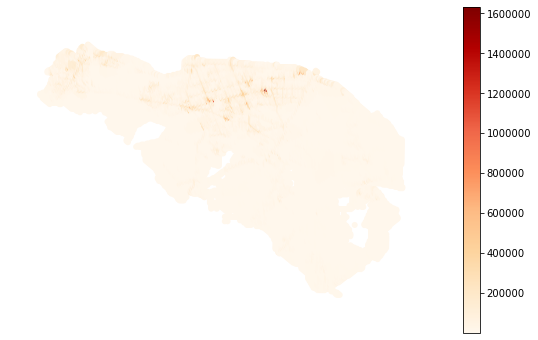

In [96]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
time_T1.plot(column='total',legend=True,cmap='OrRd',ax=ax,linewidth=0,edgecolor='0')

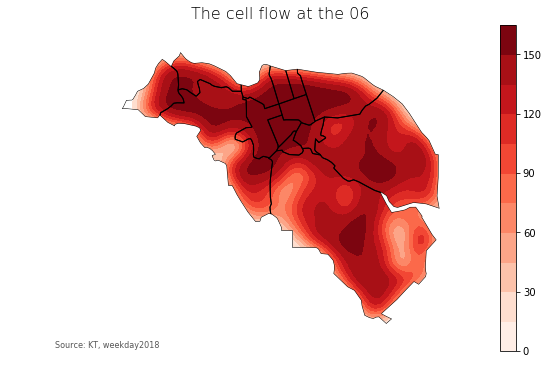

(0.0, 1.0, 0.0, 1.0)

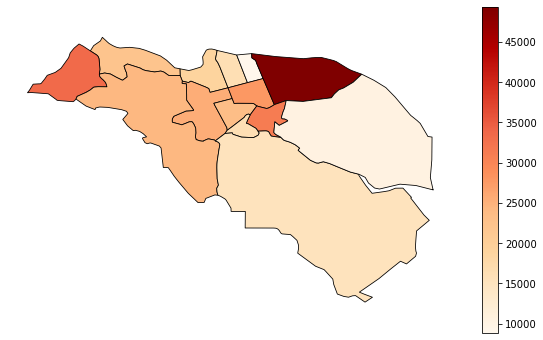

In [16]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
zip_pop.plot(column='pop',legend=True,cmap='OrRd',ax=ax,linewidth=0.8,edgecolor='0')

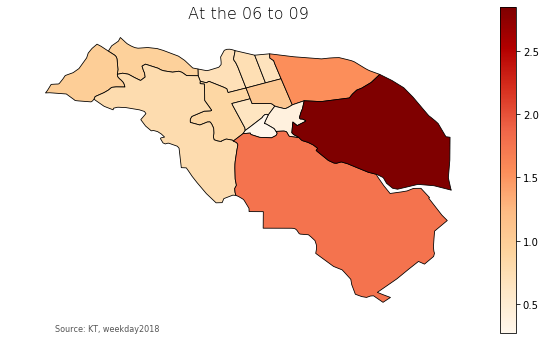

In [14]:
def total_code(df_pop,timezn,weekend):
    if weekend ==True:
        weekday=[0,1,2,3,4]
    else: weekday=[5,6]
    ymd=pd.date_range(str(min(df_pop['etl_ymd'])), str(max(df_pop['etl_ymd']))).strftime('%Y%m%d')
    df_point,df_zip=cell_flow_df(df_pop,ymd,weekday,timezn)
    KDE_plot(df_point,df_zip,ymd,timezn,weekend)
    zip_plot(df_zip,ymd,timezn,weekend)

In [220]:
df_pop=df_
timezn = [4,5,6,7]
weekend=False
if weekend ==True:
    weekday=[0,1,2,3,4]
else: weekday=[5,6]
ymd=pd.date_range(str(min(df_pop['etl_ymd'])), str(max(df_pop['etl_ymd']))).strftime('%Y%m%d')
df_point,df_zip=cell_flow_df(df_pop,ymd,weekday,timezn)
KDE_plot(df_point,df_zip,ymd,timezn,weekend)
zip_plot(df_zip,ymd,timezn,weekend)

NameError: name 'cell_flow_df' is not defined

In [78]:
df_point

,id,geometry,total,admi_cd
0,100198947,POINT (129.2461727059572 35.53686026551888),10,31140595
1,100198948,POINT (129.2461796834722 35.53731085261797),10,31140595
2,100211135,POINT (129.2467169878228 35.53640397404951),10,31140595
3,100211136,POINT (129.2467239682641 35.53685456108953),10,31140595
4,100211137,POINT (129.2467309488603 35.5373051480944),10,31140595
...,...,...,...,...
16098,103331488,POINT (129.3875933091176 35.52089338853145),1,31140670
16099,103331489,POINT (129.3876010728434 35.52134395118098),1,31140670
16100,103343639,POINT (129.3878494199392 35.5037656372844),28,31140670
16101,103355828,POINT (129.3884004245877 35.50375929043053),23,31140670


In [63]:
weekend=False
if weekend ==True:
    weekday=[0,1,2,3,4]
else: weekday=[5,6]

timezn = [6,7,8]
ymd=pd.date_range(str(min(df_pop['etl_ymd'])), str(max(df_pop['etl_ymd']))).strftime('%Y%m%d')
df_point_6_8,df_zip_6_8=cell_flow_df(df_pop,ymd,weekday,timezn)

timezn = [9,10,11]
ymd=pd.date_range(str(min(df_pop['etl_ymd'])), str(max(df_pop['etl_ymd']))).strftime('%Y%m%d')
df_point_9_11,df_zip_9_11=cell_flow_df(df_pop,ymd,weekday,timezn)


In [65]:
df_0=df_point_6_8
df_1=df_point_9_11
gdf_time_0_1=pd.merge(df_0[['id', 'total']], df_1[['id','total','geometry','admi_cd']], on='id',how='left')
gdf_time_0_1['total']=np.nan
for i in range(len(gdf_time_0_1)):
    gdf_time_0_1['total'][i]=gdf_time_0_1['total_x'][i]-gdf_time_0_1['total_y'][i]
#df_0_1,top_position_0_1,top_zip_0_1=cell_flow_plot(gdf_time_0_1[gdf_time_0_1['total']>0])
gdf_time_0_1



,id,total_x,total_y,geometry,admi_cd,total
0,100198947,55,270.0,POINT (129.2461727059572 35.53686026551888),31140595.0,-215.0
1,100198948,55,270.0,POINT (129.2461796834722 35.53731085261797),31140595.0,-215.0
2,100211135,55,270.0,POINT (129.2467169878228 35.53640397404951),31140595.0,-215.0
3,100211136,55,270.0,POINT (129.2467239682641 35.53685456108953),31140595.0,-215.0
4,100211137,55,270.0,POINT (129.2467309488603 35.5373051480944),31140595.0,-215.0
...,...,...,...,...,...,...
16899,103392411,1,1.0,POINT (129.3901778191675 35.51094924604775),31140670.0,0.0
16900,103392412,1,1.0,POINT (129.3901855944876 35.51139980895129),31140670.0,0.0
16901,103392413,1,1.0,POINT (129.3901933699802 35.51185037181943),31140670.0,0.0
16902,103392414,1,1.0,POINT (129.3902011456454 35.51230093465217),31140670.0,0.0


In [131]:
# increase
df_0=df_point_9_11
df_1=df_point_6_8
gdf_time_0_1=pd.merge(df_0[['id', 'total']], df_1[['id','total','geometry','admi_cd']], on='id',how='left')
gdf_time_0_1['total']=int(0)
for i in range(len(gdf_time_0_1)):
    a=gdf_time_0_1['total_x'][i]-gdf_time_0_1['total_y'][i]
    if a<0:
        a=0
    if str(a) == 'nan':
        a = gdf_time_0_1['total_x'][i]
        gdf_time_0_1['geometry'][i]=df_0[df_0['id'].isin([gdf_time_0_1['id'][i]])]['geometry']
        gdf_time_0_1['admi_cd'][i]=df_0[df_0['id'].isin([gdf_time_0_1['id'][i]])]['admi_cd']
    gdf_time_0_1['total'][i]=int(a)

gdf_time_0_1=gpd.GeoDataFrame(gdf_time_0_1[['id','geometry','total','admi_cd']])

In [143]:
# decrease
df_1=df_point_9_11
df_0=df_point_6_8
gdf_time_0_1=pd.merge(df_0[['id', 'total']], df_1[['id','total','geometry','admi_cd']], on='id')
gdf_time_0_1['total']=int(0)
for i in range(len(gdf_time_0_1)):
    a=gdf_time_0_1['total_x'][i]-gdf_time_0_1['total_y'][i]
    if a<0:
        a=0
    if str(a) == 'nan':
        a = gdf_time_0_1['total_x'][i]
        gdf_time_0_1['geometry'][i]=df_0[df_0['id'].isin([gdf_time_0_1['id'][i]])]['geometry']
        gdf_time_0_1['admi_cd'][i]=df_0[df_0['id'].isin([gdf_time_0_1['id'][i]])]['admi_cd']
    gdf_time_0_1['total'][i]=int(a)

gdf_time_0_1=gpd.GeoDataFrame(gdf_time_0_1[['id','geometry','total','admi_cd']])

In [141]:
gdf_time_0_1

,id,geometry,total,admi_cd
0,100198947,POINT (129.2461727059572 35.53686026551888),215,31140595
1,100198948,POINT (129.2461796834722 35.53731085261797),215,31140595
2,100211135,POINT (129.2467169878228 35.53640397404951),215,31140595
3,100211136,POINT (129.2467239682641 35.53685456108953),215,31140595
4,100211137,POINT (129.2467309488603 35.5373051480944),215,31140595
...,...,...,...,...
16602,103392411,POINT (129.3901778191675 35.51094924604775),0,31140670
16603,103392412,POINT (129.3901855944876 35.51139980895129),0,31140670
16604,103392413,POINT (129.3901933699802 35.51185037181943),0,31140670
16605,103392414,POINT (129.3902011456454 35.51230093465217),0,31140670


In [122]:
for i in range(len(gdf_time_0_1)):
    a=int(gdf_time_0_1['admi_cd'][i])
    gdf_time_0_1['admi_cd'][i]=a
gdf_time_0_1[['id','geometry','total','admi_cd']]


,id,geometry,total,admi_cd
0,100198947,POINT (129.2461727059572 35.53686026551888),215,31140595.0
1,100198948,POINT (129.2461796834722 35.53731085261797),215,31140595.0
2,100211135,POINT (129.2467169878228 35.53640397404951),215,31140595.0
3,100211136,POINT (129.2467239682641 35.53685456108953),215,31140595.0
4,100211137,POINT (129.2467309488603 35.5373051480944),215,31140595.0
...,...,...,...,...
18317,103392416,18317 POINT (129.390216697493 35.5132020602...,1,31140670.0
18318,103392417,18318 POINT (129.3902244736755 35.513652622...,1,31140670.0
18319,103392418,18319 POINT (129.3902322500307 35.514103185...,1,31140670.0
18320,103392419,18320 POINT (129.3902400265582 35.514553748...,1,31140670.0


In [172]:
street_line

,RN,RN_CD,geometry
0,울산고속도로,1000008,"0 LINESTRING (129.2605590987 35.5521783448,..."
1,동해고속도로,1000026,"0 LINESTRING (129.2436992008 35.5354969713,..."
2,산업로,3000104,"0 LINESTRING (129.3226169977 35.5080720162,..."
3,산업로,3000104,"0 LINESTRING (129.3088430109 35.5032402966,..."
4,화합로,3011003,"0 LINESTRING (129.3423929284 35.528917169, ..."
...,...,...,...
1565,테크노산업로81번길,4854920,"0 LINESTRING (129.2956160193 35.5125363264,..."
1566,테크노산업로82번길,4854921,"0 LINESTRING (129.2954618746 35.5127974444,..."
1567,신항로716번길,4854922,"0 LINESTRING (129.3648213847 35.4595082558,..."
1568,신항로742번길,4854923,"0 LINESTRING (129.3650022861 35.4618266102,..."


In [230]:
j=0
p = gdf_time_0_1.geometry[j]
id_list.append(gdf_time_0_1.id[j])
p_dist=[]
for i in range(len(street_line)):
    line = street_line.geometry[i][0]
    p_dist.append([street_line.RN_CD[i],p.distance(line)])    
a=pd.DataFrame(p_dist)
a.columns=['RN_CD','dist']
RNs=(a[a.dist.isin([min(a['dist'])])]['RN_CD'])
a

,RN_CD,dist
0,1000008,0.021015
1,1000026,0.002619
2,3000104,0.081685
3,3000104,0.071119
4,3011003,0.093582
...,...,...
1565,4854920,0.055103
1566,4854921,0.052106
1567,4854922,0.141455
1568,4854923,0.140537


In [249]:
(a[a.dist.isin([min(a['dist'])])]['RN_CD'].to_list()[0])

'1000026'

In [17]:
#print(nearest_points(street_line.geometry[0][0],gdf_time_0_1.geometry[0])[0])
RN_CD_list=[]
id_list =[]
for j in tqdm(range(len(gdf_time_0_1))):
    p = gdf_time_0_1.geometry[j]
    id_list.append(gdf_time_0_1.id[j])
    p_dist=[]
    for i in range(len(street_line)):
        line = street_line.geometry[i][0]
        p_dist.append([street_line.RN_CD[i],p.distance(line)])    
    a=pd.DataFrame(p_dist)
    a.columns=['RN_CD','dist']
    RNs=int(a[a.dist.isin([min(a['dist'])])]['RN_CD'].to_list()[0])
    RN_CD_list.append(RNs)

NameError: name 'gdf_time_0_1' is not defined

In [15]:
point_street_dict=dict(zip(wgs_set,RN_CD_list))
#point_street_dict

In [20]:
#wgs_set
RN_CD_list
point_street_dict

[3351512,
 3351512,
 3351512,
 3351512,
 3351512,
 3170044,
 3170044,
 3170044,
 3170044,
 3170044,
 3170044,
 3170044,
 3170052,
 3170052,
 3170052,
 3170052,
 3170052,
 3170052,
 3170052,
 3170052,
 3170052,
 4310696,
 4310815,
 4310815,
 4310815,
 4310815,
 4310815,
 4310815,
 4310815,
 4310815,
 3170045,
 3170045,
 3170045,
 3170045,
 3170045,
 3170045,
 3170045,
 3170045,
 3170045,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 4310751,
 4310751,
 3170048,
 3170048,
 3170048,
 3170048,
 3170048,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170041,
 3170041,
 3170041,
 3170041,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3170023,
 3351512]

{102892556: 3351512,
 102892557: 3351512,
 102892558: 3351512,
 102892560: 3351512,
 102892562: 3351512,
 102892563: 3170044,
 102892564: 3170044,
 102892565: 3170044,
 102892566: 3170044,
 102892567: 3170044,
 102892568: 3170044,
 102892569: 3170044,
 102892570: 3170052,
 102892571: 3170052,
 102892572: 3170052,
 102892573: 3170052,
 102892574: 3170052,
 102892575: 3170052,
 102892576: 3170052,
 102892577: 3170052,
 102892578: 3170052,
 102892579: 4310696,
 102892597: 4310815,
 102892598: 4310815,
 102892599: 4310815,
 102892600: 4310815,
 102892601: 4310815,
 102892602: 4310815,
 102892603: 4310815,
 102892604: 4310815,
 102892605: 3170045,
 102892608: 3170045,
 102892609: 3170045,
 102892610: 3170045,
 102892611: 3170045,
 102892614: 3170045,
 102892618: 3170045,
 102892631: 3170045,
 102892632: 3170045,
 102892633: 3170048,
 102892640: 3170048,
 102892641: 3170048,
 102892642: 3170048,
 102892643: 3170048,
 102892644: 3170048,
 102892645: 3170048,
 102892646: 3170048,
 102892647: 3

In [16]:
point_street_dict[100198947]

KeyError: 100198947

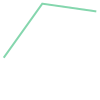

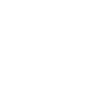

[(0.0, 0.0), (5.0, 7.0), (12.0, 6.0)]

[(4.0, 8.0)]

1.4142135623730951

POINT (5 7)


In [166]:
line = LineString([(0, 0), (5, 7), (12, 6)])  # geometry2
line
street_line.geometry[0][0]
list(line.coords)
p = Point(4,8)  # geometry1
list(p.coords)
p.distance(line)

np = nearest_points(line, p)[0]
print(np)  # POINT (5 7)
np = line.interpolate(line.project(p))

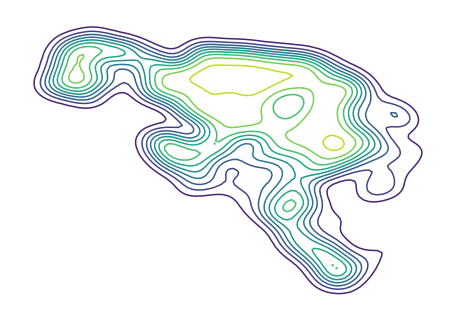

In [142]:
gplt.kdeplot(gpd.GeoDataFrame(gdf_time_0_1[['id','geometry']]))


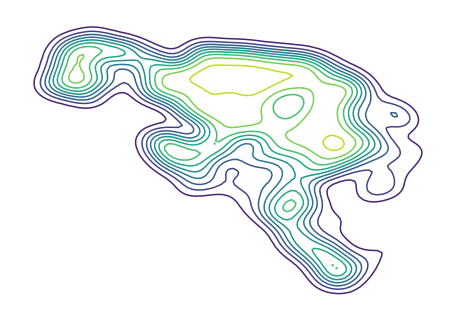

In [144]:
gplt.kdeplot(gpd.GeoDataFrame(gdf_time_0_1[['id','geometry']]))


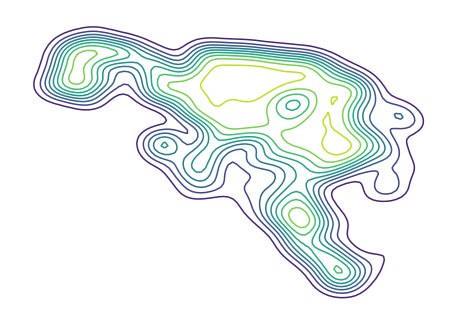

In [145]:
gplt.kdeplot(df_point)


(0.0, 1.0, 0.0, 1.0)

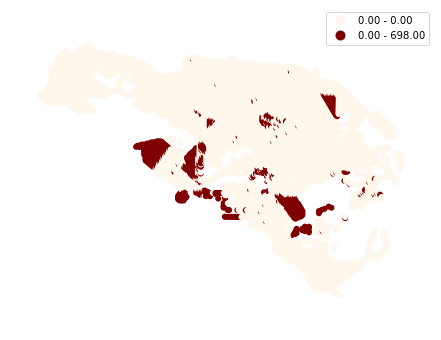

In [194]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')

gdf_time_0_1.plot(column='total',legend=True,cmap='OrRd',ax=ax,linewidth=0,scheme='quantiles')


(0.0, 1.0, 0.0, 1.0)

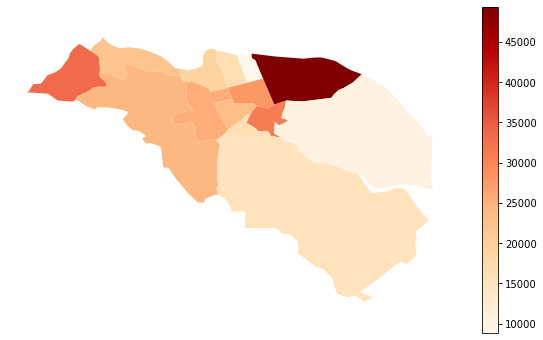

In [156]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
zip_pop.plot(column='pop',legend=True,cmap='OrRd',ax=ax,linewidth=0)

In [111]:
gplt.kdeplot(gdf_time_0_1[['id','geometry','total','admi_cd']],cbar=True,
                  #clip=df_zip_6_8.geometry,
             shade=True, cmap='Reds',
             projection=gplt.crs.AlbersEqualArea(), figsize=(10,6))



KeyError: 0

<Figure size 720x432 with 0 Axes>

In [69]:
ax = gplt.kdeplot(df_point,cbar=True,clip=df_zip.geometry,
shade=True, cmap='Reds',
projection=gplt.crs.AlbersEqualArea(), figsize=(10,6))
title=str('The cell flow at the ' + str(timezn[0]).zfill(2))
ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
date_info=w+str(ymd[0])+' to '+str(ymd[-1])
ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
a=gplt.polyplot(df_zip, ax=ax, zorder=1)
date_info='d_'+str(ymd[0])+'_'+str(ymd[-1])


AttributeError: 'DataFrame' object has no attribute 'total_bounds'

<Figure size 720x432 with 0 Axes>

In [68]:
df_zip

,admi_cd,total,adm_nm,geometry,coordinates,total_norm
0,31140510,217288,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,"[[129.3087427761205, 35.55228424713286], [129....",0.164314
1,31140520,385267,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...","[[129.3128727965418, 35.5380952826717], [129.3...",0.291340
2,31140530,249126,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,"[[129.31615368450642, 35.55056444157702], [129...",0.188390
3,31140540,315443,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,"[[129.32381724413133, 35.53123106975014], [129...",0.238539
4,31140550,92763,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,"[[129.32619918927585, 35.541602263426576], [12...",0.070148
5,31140560,524329,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,"[[129.33044641265232, 35.53169708650976], [129...",0.396499
6,31140570,1322396,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,"[[129.3309862897484, 35.549962291519066], [129...",1.000000
7,31140585,396833,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,"[[129.28952303078972, 35.548602665200626], [12...",0.300086
8,31140595,520011,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,"[[129.26055288229233, 35.55210671634574], [129...",0.393234
9,31140600,319395,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,"[[129.29467017131714, 35.542754823806455], [12...",0.241528


In [73]:
#timezn = [9,10,11]
#weekend=False
#if weekend ==True:
#    weekday=[0,1,2,3,4]
#else: weekday=[5,6]
#ymd=pd.date_range(str(min(df_0['etl_ymd'])), str(max(df_0['etl_ymd']))).strftime('%Y%m%d')
#df_point,df_zip=cell_flow_df(df_pop,ymd,weekday,timezn)
KDE_plot(gdf_time_0_1,df_zip,ymd,timezn,weekend)
#zip_plot(df_zip,ymd,timezn,weekend)

AttributeError: 'DataFrame' object has no attribute 'total_bounds'

<Figure size 720x432 with 0 Axes>

In [57]:
i=0
str(gdf_time_0_1.loc[18317]['total_y'])=='nan'
#df_point_6_8['total'][i]
#df_point_9_11



True

18321    POINT (129.3902478032584 35.51500431090524)
Name: geometry, dtype: object

In [18]:
def nearest(row, geom_union, df1, df2, geom1_col='geometry', geom2_col='geometry', src_column=None):
    """Find the nearest point and return the corresponding value from specified column."""
    # Find the geometry that is closest
    nearest = df2[geom2_col] == nearest_points(row[geom1_col], geom_union)[1]
    # Get the corresponding value from df2 (matching is based on the geometry)
    value = df2[nearest][src_column].get_values()[0]
    return value

In [19]:
i=1
#nearest_points(street_line['geometry'][i],df_point['geometry'][i])
total=[]
for i in range(len(df_point)):
    total.append(street_line['geometry'][0].contains(df_point['geometry'][i]))

In [ ]:
df2=street_line

unary_union = df2['geometry'].unary_union

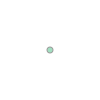

In [20]:
df_point['geometry'][0]

In [302]:
for data in [df_06]:
    df_pop=data
    for i in range(0,24):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)

NameError: name 'df_06' is not defined

In [ ]:
df_point,df_zip=cell_flow_df(df_pop,ymd,weekday,timezn)


In [ ]:
KDE_plot(df_point,df_zip,ymd,timezn,weekend=False)
zip_plot(df_zip,ymd,timezn,weekend=False)

In [ ]:
for data in [df_01]:
    df_pop=data
    for i in range(0,1):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)
#df_01,df_02,df_03,df_04,df_05,

In [ ]:
for data in [df_01,df_02,df_03,df_04,df_05,df_07,df_08,df_09,df_10,df_11,df_12]:
    df_pop=data
    for i in range(0,24):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)

In [ ]:
for data in [df_05]:
    df_pop=data
    for i in range(0,24):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)

In [ ]:
df_pop=read('./data_2/ULSAN_NG_201807.csv')
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    


In [15]:
df_pop=read('./data_2/ULSAN_NG_201812.csv')


In [72]:

ZIP.columns[1:]

Index(['adm_nm', 'adm_cd', 'adm_cd2', 'geometry'], dtype='object')

In [75]:
adding_list = list(ZIP.columns[1:])
test = ulsan_zip.copy()
adding_df = pd.DataFrame(columns = adding_list)

In [89]:
ZIP

,OBJECTID,adm_nm,adm_cd,adm_cd2,geometry
0,1,서울특별시 종로구 사직동,1101053,1111053000,(POLYGON ((126.9768888427482 37.57565077944879...
1,2,서울특별시 종로구 삼청동,1101054,1111054000,"(POLYGON ((126.982689386493 37.5950655194224, ..."
2,3,서울특별시 종로구 부암동,1101055,1111055000,(POLYGON ((126.9758511377569 37.59656422224408...
3,4,서울특별시 종로구 평창동,1101056,1111056000,(POLYGON ((126.9750746678809 37.63138628651299...
4,5,서울특별시 종로구 무악동,1101057,1111057000,"(POLYGON ((126.960673532739 37.58079784202972,..."
...,...,...,...,...,...
3476,1320,경기도 부천시 대산동,3105092,4119074600,(POLYGON ((126.7652793134809 37.48661332386838...
3477,1321,경기도 부천시 소사본동,3105093,4119075000,(POLYGON ((126.8020937377895 37.47774863456012...
3478,1316,경기도 부천시 범안동,3105094,4119079500,(POLYGON ((126.8305141069955 37.46483139226068...
3479,1322,경기도 부천시 성곡동,3105095,4119080000,(POLYGON ((126.8048631417384 37.52129448965731...


In [ ]:
test2 = pd.concat([test, adding_df], axis = 1)
ulsan_zip

In [21]:
vmax=sum(df_pop['total'])

tizen=[14]
weekend=False
if weekend ==True:
    weekday=[0,1,2,3,4]
else: weekday=[5,6]
ymd=pd.date_range(str(min(df_pop['etl_ymd'])), str(max(df_pop['etl_ymd']))).strftime('%Y%m%d')
df_point,df_zip=cell_flow_df(df_pop,ymd,weekday,timezn)


In [25]:
df_point['norm_total']=np.nan
for i in range(len(df_point)):
    df_point['norm_total'][i]=df_point['total'][i]/vmax
df_point_0=df_point[['id','geometry','norm_total']]

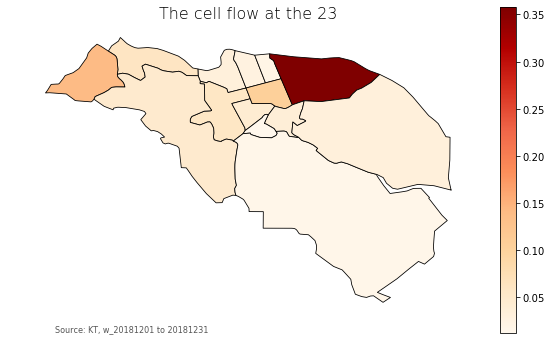

In [31]:
vmax=sum(df_zip['total'])

df_zip['norm_total']=np.nan
for i in range(len(df_zip)):
    df_zip['norm_total'][i]=df_zip['total'][i]/vmax
df_zip_0=df_zip[['geometry','norm_total']]

def zip_plot_0(df_zip,ymd,timezn,weekend):    
    if weekend ==True:
        w='wd_'
    else: w='w_'

    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.axis('off')
    title=str('The cell flow at the ' + str(timezn[0]).zfill(2))
    ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
    date_info=w+str(ymd[0])+' to '+str(ymd[-1])
    ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
    df_zip.plot(column='norm_total',legend=True,cmap='OrRd',ax=ax,linewidth=0.8,edgecolor='0')
    date_info='d_'+str(ymd[0])+'_'+str(ymd[-1])
    fig.savefig('./fig/zip_'+w+date_info+'_t_'+str(timezn[0]).zfill(2)+'.png', dpi=300)
zip_plot_0(df_zip_0,ymd,timezn,weekend)

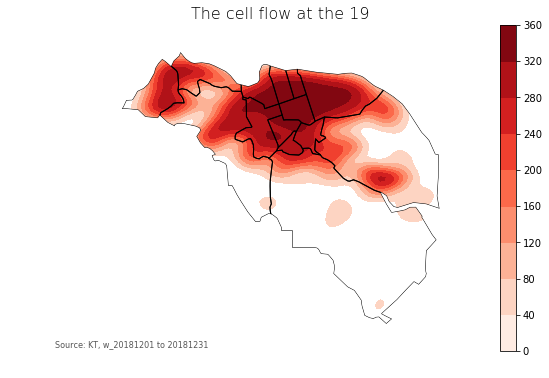

In [26]:
KDE_plot(df_point_0,df_zip,ymd,timezn,weekend)


In [ ]:
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    


"\ndf_pop=read('./data_2/ULSAN_NG_201808.csv')\nfor i in range(0,24):\n    timezn=[i]\n    total_code(df_pop,timezn,weekend=False)\n    total_code(df_pop,timezn,weekend=True)    \ndf_pop=read('./data_2/ULSAN_NG_201809.csv')\nfor i in range(0,24):\n    timezn=[i]\n    total_code(df_pop,timezn,weekend=False)\n    total_code(df_pop,timezn,weekend=True)    \n\n"

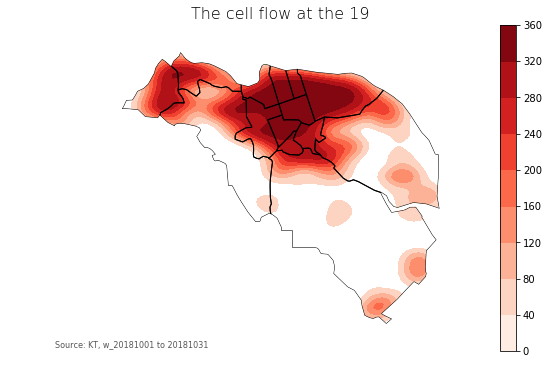

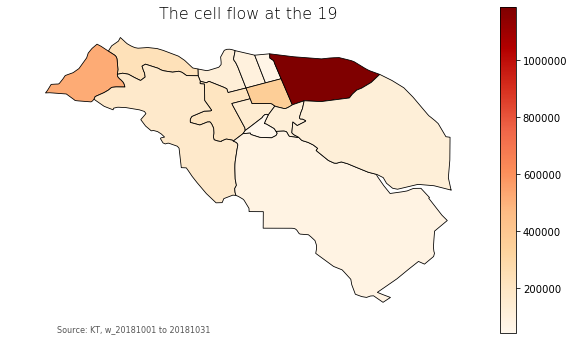

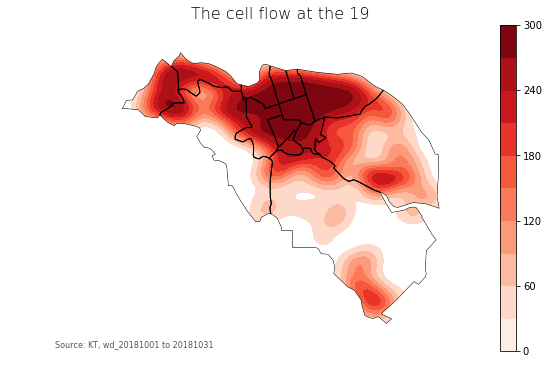

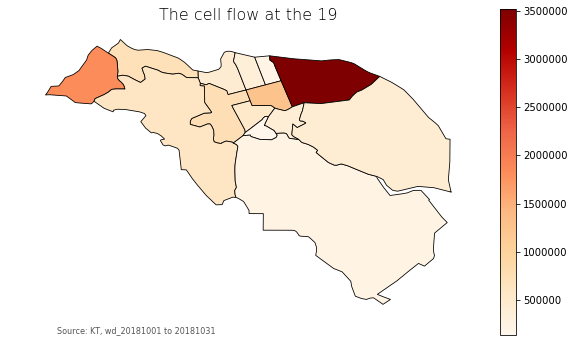

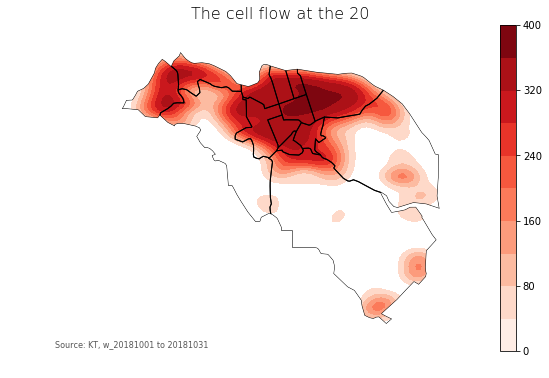

...

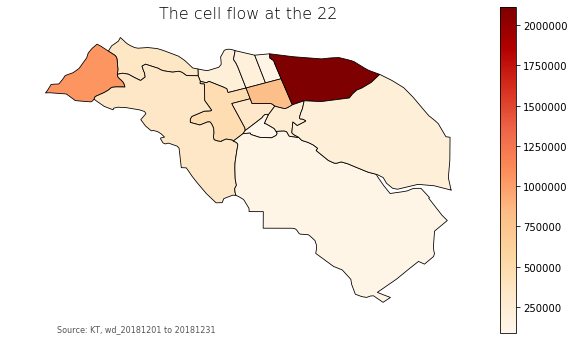

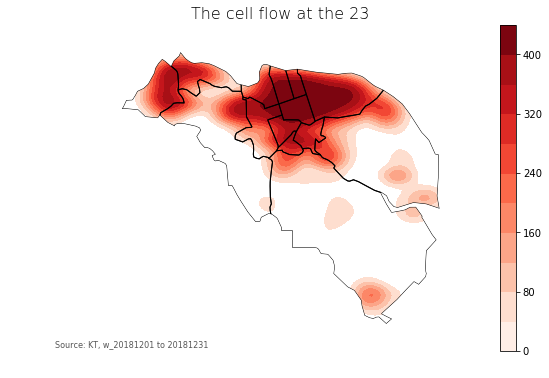

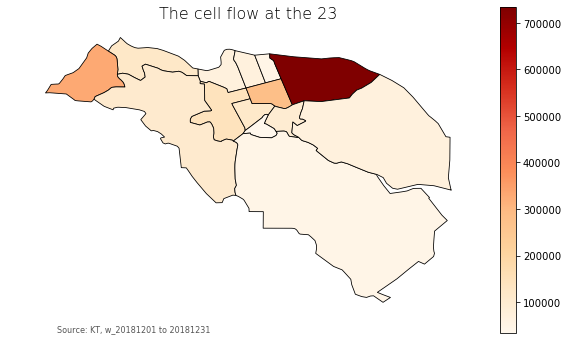

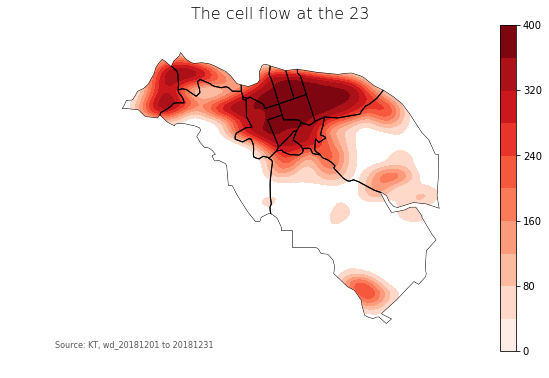

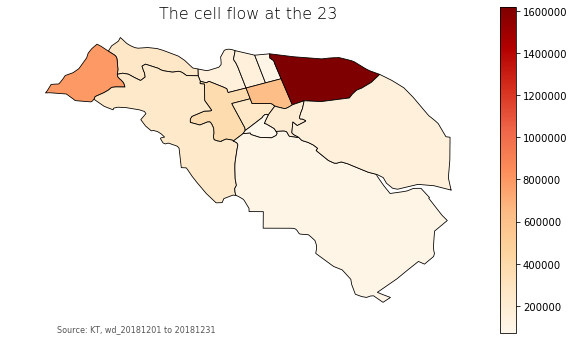

In [27]:
'''
df_pop=read('./data_2/ULSAN_NG_201808.csv')
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    
df_pop=read('./data_2/ULSAN_NG_201809.csv')
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    

'''
df_pop=read('./data_2/ULSAN_NG_201810.csv')
for i in range(19,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    
df_pop=read('./data_2/ULSAN_NG_201811.csv')
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    
df_pop=read('./data_2/ULSAN_NG_201812.csv')
for i in range(0,24):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)    


In [ ]:

for data in [df_05]:
    df_pop=data
    for i in range(0,24):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)

In [2]:
for data in [df_05,df_07,df_08,df_09,df_10,df_11,df_12]:
    df_pop=data
    for i in range(0,24):
        timezn=[i]
        total_code(df_pop,timezn,weekend=False)
        total_code(df_pop,timezn,weekend=True)

NameError: name 'df_05' is not defined

In [217]:
for i in range(0,23):
    timezn=[i]
    total_code(df_pop,timezn,weekend=False)
    total_code(df_pop,timezn,weekend=True)

[0]
[1]
[2]
[3]
[4]
[5]
[6]
[7]
[8]
[9]
[10]
[11]
[12]
[13]
[14]
[15]
[16]
[17]
[18]
[19]
[20]
[21]
[22]


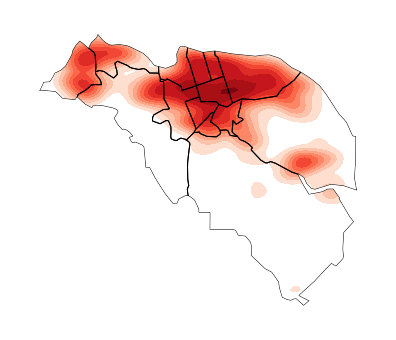

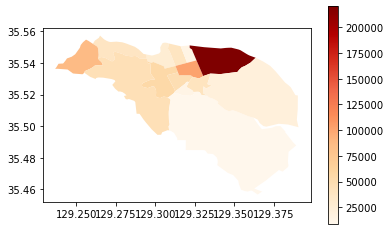

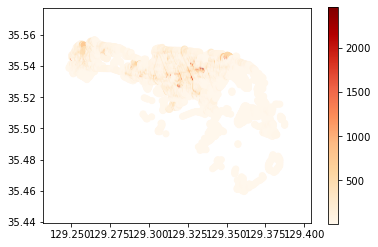

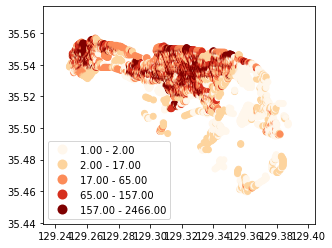

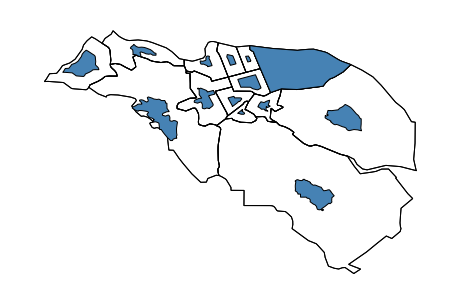

In [160]:
ax = gplt.kdeplot(
    df_point, clip=df_zip.geometry,
    shade=True, cmap='Reds',
    projection=gplt.crs.AlbersEqualArea())
gplt.polyplot(df_zip, ax=ax, zorder=1)

df_zip.plot(column='total',legend=True,cmap='OrRd')
df_point.plot(column='total',legend=True,cmap='OrRd')
df_point.plot(column='total',legend=True,cmap='OrRd',scheme='quantiles')
ax=gplt.cartogram(df_zip,scale='total')
gplt.polyplot(df_zip,ax=ax)

a=gplt.polyplot(gdf_time_zip_0,ax=ax)
#a.figure.savefig('cartogram.png', dpi=300)


In [ ]:

ax = gplt.kdeplot(gdf_time_0,cbar=True,clip=gdf_time_zip_0.geometry,
    shade=True, cmap='Reds',
    projection=gplt.crs.AlbersEqualArea())
a=gplt.polyplot(gdf_time_zip_0, ax=ax, zorder=1)
fig, ax = plt.subplots(1, figsize=(10, 6))


vmin=min(gdf_time_0['total'])
vmax=max(gdf_time_0['total'])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)
ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
date_info='d_'+str(ymd[0])+'to'+str(ymd[-1])


(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'The cell flow at the 02')

Text(0.1, 0.1, 'Source: KT, w_20180604 to 20180611')

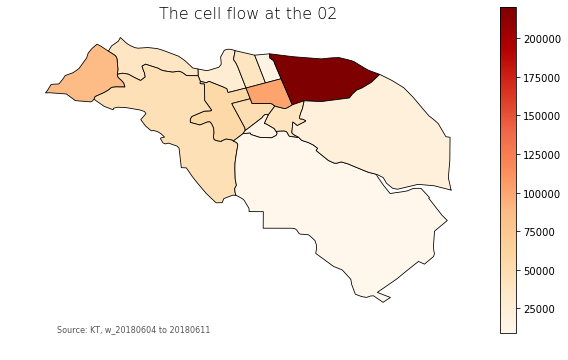

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'The cell flow at the 06')

Text(0.1, 0.1, 'Source: KT, w_20180604 to 20180611')

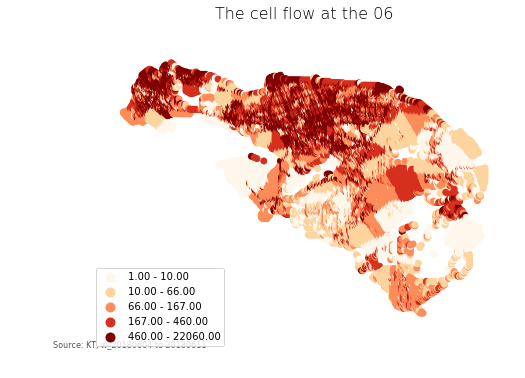

In [148]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
title=str('The cell flow at the ' + str(timezn[0]).zfill(2))
ax.set_title(title, fontdict={'fontsize': '16', 'fontweight' : '3'})
date_info='w_'+str(ymd[0])+' to '+str(ymd[-1])
ax.annotate('Source: KT, ' + date_info,xy=(0.1, .1),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=8, color='#555555')
gdf_time_0.plot(column='total',legend=True,cmap='OrRd',ax=ax,scheme='quantiles')
date_info='d_'+str(ymd[0])+'_'+str(ymd[-1])
#fig.savefig('w_'+date_info+'_t_'+str(timezn[0]).zfill(2)+'.png', dpi=300)

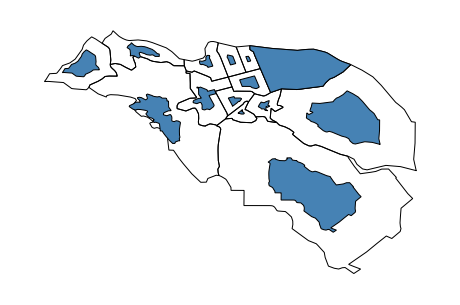

In [59]:
#f, ax = plt.subplots(1, figsize=(12, 10))
ax=gplt.cartogram(gdf_time_zip_0,scale='total')
a=gplt.polyplot(gdf_time_zip_0,ax=ax)
a.figure.savefig('cartogram.png', dpi=300)



,OBJECTID,adm_nm,adm_cd,adm_cd2,geometry,admi_cd
0,1,서울특별시 종로구 사직동,1101053,1111053000,(POLYGON ((126.9768888427482 37.57565077944879...,11110530.0
1,2,서울특별시 종로구 삼청동,1101054,1111054000,"(POLYGON ((126.982689386493 37.5950655194224, ...",11110540.0
2,3,서울특별시 종로구 부암동,1101055,1111055000,(POLYGON ((126.9758511377569 37.59656422224408...,11110550.0
3,4,서울특별시 종로구 평창동,1101056,1111056000,(POLYGON ((126.9750746678809 37.63138628651299...,11110560.0
4,5,서울특별시 종로구 무악동,1101057,1111057000,"(POLYGON ((126.960673532739 37.58079784202972,...",11110570.0
...,...,...,...,...,...,...
3476,1320,경기도 부천시 대산동,3105092,4119074600,(POLYGON ((126.7652793134809 37.48661332386838...,41190746.0
3477,1321,경기도 부천시 소사본동,3105093,4119075000,(POLYGON ((126.8020937377895 37.47774863456012...,41190750.0
3478,1316,경기도 부천시 범안동,3105094,4119079500,(POLYGON ((126.8305141069955 37.46483139226068...,41190795.0
3479,1322,경기도 부천시 성곡동,3105095,4119080000,(POLYGON ((126.8048631417384 37.52129448965731...,41190800.0


,BAS_MGT_SN,CTP_KOR_NM,SIG_CD,SIG_KOR_NM,BAS_ID,BAS_AR,NTFC_DE,MVMN_DE,MVMN_RESN,OPERT_DE,geometry
0,3114000133,울산광역시,31140,남구,44635,0.121938,20121221,None,None,None,"POLYGON ((1160279.517673134 1729820.040716683,..."
1,3117000101,울산광역시,31170,동구,44003,0.030063,20121221,None,None,None,"POLYGON ((1175035.362327983 1729502.001794788,..."
2,3117000102,울산광역시,31170,동구,44010,1.933378,20121221,None,None,None,"POLYGON ((1174331.22972778 1728933.220905363, ..."
3,3117000103,울산광역시,31170,동구,44002,0.026871,20121221,None,None,None,"POLYGON ((1174549.887323225 1729630.302185309,..."
4,3114000084,울산광역시,31140,남구,44712,0.307746,20121221,None,None,None,"POLYGON ((1167531.048571596 1729059.526579265,..."


Text(0.5, 1, 'Ulsan')

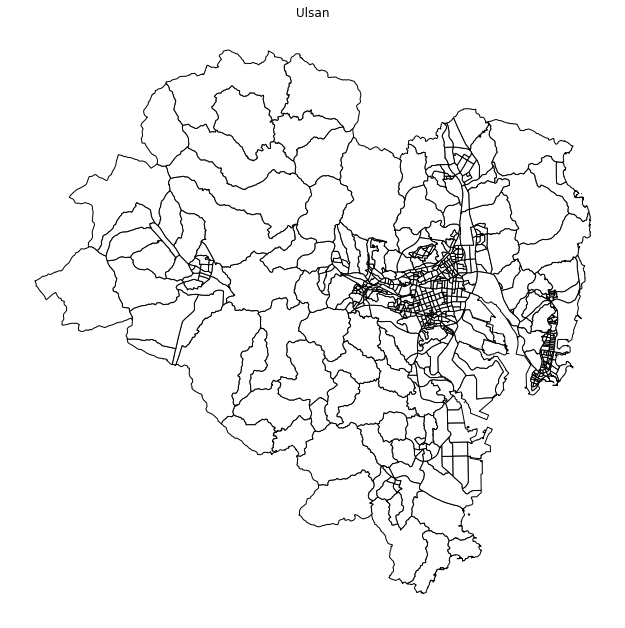

In [39]:
ulsan_file = "./data/TL_KODIS_BAS_31.shp"
ulsan = gpd.read_file(ulsan_file, encoding='euckr')
ulsan.head()
ax = ulsan.plot(figsize=(11, 11), color="w", edgecolor="k")
ax.set_title("Ulsan")
ax.set_axis_off()
plt.show()


In [33]:
boroughs.head()
collisions.columns
#ax
collisions.total_bounds

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330385.03697,1.623853e+09,(POLYGON ((-74.05050806403247 40.5664220341608...
1,4,Queens,861038.47930,3.049947e+09,(POLYGON ((-73.83668274106708 40.5949466970158...
2,3,Brooklyn,726568.94634,1.959432e+09,(POLYGON ((-73.8670614947212 40.58208797679338...
3,1,Manhattan,358532.95642,6.364422e+08,(POLYGON ((-74.01092841268033 40.6844914725429...
4,2,Bronx,464517.89055,1.186804e+09,(POLYGON ((-73.89680883223775 40.7958084451597...


Index(['id', 'ON STREET NAME', 'NUMBER OF MOTORIST KILLED',
       'CONTRIBUTING FACTOR VEHICLE 3', 'NUMBER OF CYCLIST INJURED',
       'LONGITUDE', 'OFF STREET NAME', 'VEHICLE TYPE CODE 4', 'LATITUDE',
       'LOCATION', 'VEHICLE TYPE CODE 1', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF PERSONS KILLED', 'CONTRIBUTING FACTOR VEHICLE 4',
       'CONTRIBUTING FACTOR VEHICLE 2', 'NUMBER OF PEDESTRIANS KILLED',
       'CROSS STREET NAME', 'NUMBER OF PERSONS INJURED', 'VEHICLE TYPE CODE 2',
       'BOROUGH', 'CONTRIBUTING FACTOR VEHICLE 1', 'ZIP CODE',
       'VEHICLE TYPE CODE 3', 'NUMBER OF CYCLIST KILLED', 'DATE', 'UNIQUE KEY',
       'CONTRIBUTING FACTOR VEHICLE 5', 'VEHICLE TYPE CODE 5', 'TIME',
       'NUMBER OF PEDESTRIANS INJURED', 'geometry'],
      dtype='object')

array([-74.2482769,  40.5023408, -73.7025904,  40.9096277])

In [47]:
#시각화
gdf_time_zip
fig, ax = plt.subplots(1, 1,1)
gdf_time_zip.plot(column='total',legend=True,cmap='OrRd')
plt.show()

#gdf_time.plot(column='total',legend=True,cmap='OrRd',scheme='quantiles') #레벨을 나눠 좀 더 눈에 띄게 만듦
#plt.show()


,admi_cd,total,adm_nm,geometry,coordinates,total_norm
0,31140510,273128,울산광역시 남구 신정1동,(POLYGON ((129.3087427761205 35.55228424713286...,"[[129.3087427761205, 35.55228424713286], [129....",0.187270
1,31140520,464778,울산광역시 남구 신정2동,"(POLYGON ((129.3128727965418 35.5380952826717,...","[[129.3128727965418, 35.5380952826717], [129.3...",0.318675
2,31140530,257774,울산광역시 남구 신정3동,(POLYGON ((129.3161536845064 35.55056444157702...,"[[129.31615368450642, 35.55056444157702], [129...",0.176743
3,31140540,331437,울산광역시 남구 신정4동,(POLYGON ((129.3238172441313 35.53123106975014...,"[[129.32381724413133, 35.53123106975014], [129...",0.227249
4,31140550,107404,울산광역시 남구 신정5동,(POLYGON ((129.3261991892759 35.54160226342658...,"[[129.32619918927585, 35.541602263426576], [12...",0.073641
5,31140560,545940,울산광역시 남구 달동,(POLYGON ((129.3304464126523 35.53169708650976...,"[[129.33044641265232, 35.53169708650976], [129...",0.374323
6,31140570,1458472,울산광역시 남구 삼산동,(POLYGON ((129.3309862897484 35.54996229151907...,"[[129.3309862897484, 35.549962291519066], [129...",1.000000
7,31140585,424883,울산광역시 남구 삼호동,(POLYGON ((129.2895230307897 35.54860266520063...,"[[129.28952303078972, 35.548602665200626], [12...",0.291321
8,31140595,622958,울산광역시 남구 무거동,(POLYGON ((129.2605528822923 35.55210671634574...,"[[129.26055288229233, 35.55210671634574], [129...",0.427131
9,31140600,419957,울산광역시 남구 옥동,(POLYGON ((129.2946701713171 35.54275482380645...,"[[129.29467017131714, 35.542754823806455], [12...",0.287943


ValueError: 1 is not a valid value for sharex; supported values are 'all', 'row', 'col', 'none'

<Figure size 432x288 with 0 Axes>

In [116]:
transproj_eq.itransform(street_0['coordinates'][0])
WGS_list=[]
for pt in transproj_eq.itransform(street_0['coordinates'][0]):
    print(pt)
    WGS=('{:.20f} {:.20f}'.format(*pt).split(' '))
    WGS_list.append((float(WGS[0]),float(WGS[1])))
WGS_list

<generator object Transformer.itransform at 0x7faeb1c3f430>

(129.26055909869015, 35.552178344783336)
(129.26102811527792, 35.55187257036134)
(129.26156794076152, 35.5515265503883)
(129.2623765955396, 35.55099821912802)
(129.2630427837346, 35.550589083528465)
(129.26325470418504, 35.55046287823553)


[(129.26055909869015, 35.552178344783336),
 (129.26102811527792, 35.55187257036134),
 (129.26156794076152, 35.5515265503883),
 (129.2623765955396, 35.55099821912802),
 (129.2630427837346, 35.550589083528465),
 (129.26325470418504, 35.55046287823553)]

In [4]:

def multipolygon_to_coordinates(x): 
    lon, lat = x[0].exterior.xy
    return [[x, y] for x, y in zip(lon, lat)]



In [7]:
street

,ALWNC_DE,ALWNC_RESN,BSI_INT,ENG_RN,MVMN_DE,MVMN_RESN,MVM_RES_CD,NTFC_DE,OPERT_DE,RBP_CN,...,RDS_MAN_NO,REP_CN,RN,RN_CD,ROAD_BT,ROAD_LT,ROA_CLS_SE,SIG_CD,WDR_RD_CD,geometry
0,20091210,국토해양부 노선명을 이용하여 명명함,2000,Ulsan Expressway,20180531,직권수정(속성변경),99,20101228,20190527111001,울산 울주군 언양읍(언양JC),...,5491,"울산 남구 무거동 327-40대(울산JC, 신복R)",울산고속도로,1000008,30.0,14300.000,1,31140,2,LINESTRING (1159575.441008934 1729891.09954385...
1,20101228,국토해양부 노선명을 이용하여 명명함,2000,Donghae Expressway,20141030,광역도로 도로구간 선형 위치 정비,99,20101228,20170914131000,부산 해운대구(해운대IC),...,5493,강원 속초시,동해고속도로,1000026,40.0,381680.000,1,31140,1,LINESTRING (1158079.866602266 1728013.56858764...
2,20090630,물류수송 위한 산업도로,20,Saneop-ro,20141115,직권수정(속성변경),99,20091210,20160816180633,두왕동 11-3,...,1558,삼산동 69-0,산업로,3000104,40.0,66489.000,3,31140,1,LINESTRING (1165291.39411661 1725100.947543386...
3,20090630,물류수송 위한 산업도로,20,Saneop-ro,20141115,직권수정(속성변경),99,20091210,20160816180633,두왕동 11-3,...,1489,삼산동 69-0,산업로,3000104,40.0,66489.000,3,31140,1,LINESTRING (1164051.937982487 1724541.99309894...
4,20010322,"중,남구를 연결하는 도로로써 주민의 화합을 도모하는 취지",20,Hwahap-ro,20141030,직권수정(속성변경),99,20010322,20190527092404,여천동 996-4,...,1522,삼산동 1043-2,화합로,3011003,10.0,5118.000,3,31140,2,LINESTRING (1167041.845132683 1727446.51728421...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1565,20170605,테크노산업로에서분기되는도로구간으로기초번호를활용하여부여,20,Techno saneop-ro 81beon-gil,20170518,직권수정(속성변경),99,20170605,20190527134330,두왕동 701-9,...,5562,두왕동 278-0,테크노산업로81번길,4854920,16.0,784.916,4,31140,3,LINESTRING (1162833.418922818 1725551.21682974...
1566,20170605,테크노산업로에서분기되는도로구간으로기초번호를활용하여부여,20,Techno saneop-ro 82beon-gil,20170518,직권수정(속성변경),99,20170605,20190527134432,두왕동 산72-1,...,5563,옥동 44-2,테크노산업로82번길,4854921,21.0,878.137,4,31140,3,LINESTRING (1162818.911584251 1725579.92637796...
1567,20170623,신항로에서분기되는도로구간으로기초번호를활용하여부여,20,Sinhang-ro 716beon-gil,20170518,직권수정(속성변경),99,20170623,20190527114004,황성동 831-0,...,5564,남화동 329-4,신항로716번길,4854922,32.0,1870.017,4,31140,3,LINESTRING (1169221.118028001 1719785.61054967...
1568,20170605,신항로에서분기되는도로구간으로기초번호를활용하여부여,20,Sinhang-ro 742beon-gil,20170518,직권수정(속성변경),99,20170605,20190527114458,황성동 33-13일원,...,5565,황성동 846-0,신항로742번길,4854923,21.0,1165.086,4,31140,3,LINESTRING (1169232.677685566 1720043.08186779...


In [ ]:
ax = street.plot(figsize=(11, 11), color="w", edgecolor="k")
ax.set_title("Ulsan")
ax.set_axis_off()
plt.show()
'''
#남구 polygon 파일 
sample = ulsan[ulsan.SIG_KOR_NM == "남구"]

ax = plt.subplot(2, 2, 1)
sample.plot(color='k', edgecolor="w", ax=ax)
ax.set_title("남구")
ax.set_axis_off()

'''